# Visual Genome Region Description Embeddings

In [15]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy as np
from visual_genome import api as vg
import urllib.request
from PIL import Image
import tensorflow as tf
import json
import nltk
import time
import torch
import re
import seaborn as sns
import pandas as pd
from nltk.cluster import KMeansClusterer
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer, util
from nltk.cluster import KMeansClusterer
from scipy.spatial import distance_matrix, distance
from sklearn.manifold import TSNE

In [16]:
nltk.download('wordnet')
from nltk.corpus import wordnet as wn

[nltk_data] Downloading package wordnet to /home/menorf/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## Images visualizations

In [17]:
def visualize_regions(image, regions):
    fig = plt.gcf()
    fig.set_size_inches(18.5, 10.5)
    img = Image.open(urllib.request.urlopen(image.url))
    plt.imshow(img)
    ax = plt.gca()
    for region in regions:
        ax.add_patch(Rectangle((region.x, region.y),
                               region.width,
                               region.height,
                               fill=False,
                               edgecolor='red',
                               linewidth=3))
        ax.text(region.x, region.y, region.phrase, style='italic', bbox={'facecolor':'white', 'alpha':0.7, 'pad':10})
    fig = plt.gcf()
    plt.tick_params(labelbottom='off', labelleft='off')
    plt.show()

In [18]:
def retrieve_image(image_id):
    # find the image from api
    image = vg.get_image_data(id=image_id)   # api also works here
    if image:
        print ("Image data:", image)
        reg = vg.get_region_descriptions_of_image(id=image_id)
        # show images
        visualize_regions(image, reg[:8])    # call with fewer regions for better visualization

## SentenceTransformer

In [19]:
# pre-trained models
#model_1 = SentenceTransformer('bert-base-nli-mean-tokens')
#model_2 = SentenceTransformer('paraphrase-mpnet-base-v2')    # raises warning
#model_3 = SentenceTransformer('paraphrase-distilroberta-base-v2')
#model_4 = SentenceTransformer('stsb-mpnet-base-v2')
model_5 = SentenceTransformer('stsb-roberta-large')         # this is much slower, but the best for semantic similarity
models = [model_5]

In [20]:
def get_embeddings(model, region_sentences):
    #start = time.perf_counter()
    sentence_embeddings = model.encode(region_sentences)
    #end = time.perf_counter()
    #print(f"Elapsed time for training {end - start:0.4f} seconds")
    return sentence_embeddings

## Read images and their descriptions


In [21]:
image_regions = pd.read_csv("image_regions.xls")

In [22]:
image_regions.head()

,Image_id,region_sentences
0,1,"['the clock is green in colour', 'shade is alo..."
1,2,"['walk sign is lit up', 'man wearing silver ba..."
2,3,"['multi-line office phone system', 'electrical..."
3,4,"['blue curtains with sailboats on them.', 'a b..."
4,5,"['the floor is wooden', 'white cables are on t..."


In [23]:
image_regions["region_sentences"] = image_regions["region_sentences"].apply(eval)
regions = image_regions["region_sentences"].tolist()

# Get embeddings

In [24]:
key_list = ["embeddings_5"]
embeddings = dict.fromkeys(key_list)
start = time.perf_counter()
index = 0
for model, key in zip(models, key_list):
    values = []
    for corpus in regions:
        # returns a list of lists, one 768-length embedding per region sentence. 
        # Number of rows corresponds to number of sentences
        if corpus:
            emb = get_embeddings(model, corpus)
            # get mean value columnwise, so that sentence embeddings are averaged per region for each image
            emb = np.mean(np.array(emb), axis=0) 
            # for each model, a 768-length embedding is stored
            values.append(emb)
            index+=1
            #print(f"Elapsed time {(time.perf_counter()) - start:0.4f} seconds")
        else:
            values.append(0)
            print(0)

    embeddings[key] = values

In [25]:
for key in key_list:
    image_regions[key] = pd.Series(embeddings[key], index=image_regions.index) 
    # number of sentences x 768

In [26]:
image_regions.head()

,Image_id,region_sentences,embeddings_5
0,1,"[the clock is green in colour, shade is along ...","[-0.083304375, -0.07703802, 0.21811487, -0.195..."
1,2,"[walk sign is lit up, man wearing silver backp...","[-0.071260214, -0.11359634, 0.17361087, -0.201..."
2,3,"[multi-line office phone system, electrical an...","[0.059111096, 0.0074685435, -0.052292816, -0.5..."
3,4,"[blue curtains with sailboats on them., a blac...","[-0.2649827, 0.15367973, -0.38227776, -0.02600..."
4,5,"[the floor is wooden, white cables are on the ...","[0.16827948, 0.03742139, -0.37984872, -0.37902..."


# Clustering

In [28]:
def clustering_question(images_regions, key, NUM_CLUSTERS):

    sentences = images_regions['region_sentences']

    X = np.array(images_regions[key].tolist())

    data = images_regions[['Image_id', 'region_sentences', key]].copy()
    
    kclusterer = KMeansClusterer(
        NUM_CLUSTERS, distance=nltk.cluster.util.cosine_distance,
        avoid_empty_clusters=True)

    assigned_clusters = kclusterer.cluster(data[key], assign_clusters=True)

    data['cluster'] = pd.Series(assigned_clusters, index=data.index)
    data['centroid'] = data['cluster'].apply(lambda x: kclusterer.means()[x])

    return data, assigned_clusters

In [29]:
def distance_from_centroid(row):
    # type of emb and centroid is different, hence using tolist below
    return distance_matrix([row[key]], [row['centroid'].tolist()])[0][0]

In [ ]:
def nltk_inertia(feature_matrix, centroid):
    sum_ = []
    for i in range(feature_matrix.shape[0]):
        sum_.append(np.sum((feature_matrix[i] - centroid[i])**2)) 

    return sum(sum_) 
def number_of_clusters(image_regions, key):
    sse = []
    list_k = list(range(10, 500, 50))

    for k in list_k:
        data, assigned_clusters = clustering_question(image_regions, key, k)
        sse.append(nltk_inertia(data[key].to_numpy(), data.centroid.to_numpy()))

    # Plot sse against k
    plt.figure(figsize=(6, 6))
    plt.title('Elbow method for '+key)
    plt.plot(list_k, sse, '-o')
    plt.xlabel(r'Number of clusters k')
    plt.ylabel('Sum of squared distance')
    plt.show()
"""
for key in key_list:
    number_of_clusters(image_regions, key)
"""

In [46]:
n_clusters = 15

def make_clusters(key, images_regions, n_clusters):
    data, assigned_clusters = clustering_question(images_regions, key, NUM_CLUSTERS = n_clusters)
    # Compute centroid distance to the data
    data['distance_from_centroid'] = data.apply(distance_from_centroid, axis=1)
    return data

## TSNE visualizations

In [47]:
def tsne_visual(embedding_clusters, key):
    mat = np.matrix([x for x in embedding_clusters[key]])
    t_sne = TSNE(n_components=2)
    low_dim_data = t_sne.fit_transform(mat)
    print('Lower dim data has shape',low_dim_data.shape)
    tsne_df =  pd.DataFrame(low_dim_data, embedding_clusters['cluster'])
    plt.figure(figsize=(20,12))
    ax = sns.scatterplot(data=tsne_df[0], x=tsne_df[0], y=tsne_df[1], hue=tsne_df.index, palette = "viridis", s=80)
    ax.set_title('T-SNE BERT Embeddings')
    plt.show()
    return low_dim_data

## Similar image retrieval

In [32]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

In [54]:
def find_distances(images_regions, input_id, key, input_embedding = np.zeros(5)):
    distances = []     
    image_ids=images_regions.Image_id
    if input_id>0:
        reference_embedding = images_regions.loc[images_regions.Image_id == input_id][key]
        reference_embedding = reference_embedding.values[0].reshape(-1,1)
        corpus_embeddings = images_regions.loc[images_regions.Image_id != input_id][key]
    else:
        reference_embedding = input_embedding
        corpus_embeddings = images_regions[key]
        
    for j in range(len(corpus_embeddings)):  # rows of def_embeddings matrix
        defin = j
        if image_ids[j]!=input_id:      # avoid calculating distance with itself
            corpus = corpus_embeddings[j].reshape(-1,1)
            # euclidean distance between multidimensional vectors
            dist = distance.euclidean(reference_embedding, corpus)
            distances.append([image_ids[j], dist]) 
        
    # store in df
    col_names = ['image_id', 'distances']
    distances_df = pd.DataFrame(distances, columns=col_names)
    distances_df = distances_df.sort_values(by='distances', ascending=True)
    distances_df.to_csv('distances.csv', index=False)
    return distances_df

In [55]:
# given image id to retrieve its k most similar images

def retrieve_images(key, images_regions, input_id = -1, input_embedding = np.zeros(5)):
    print('Images retrieved using method:', key)
    top_k=10
    
    if input_id>0:
    # top_k results to return
        print('Reference image:', input_id)
        retrieve_image(input_id)
        distances_df=find_distances(images_regions, input_id, key)
    else:
        distances_df=find_distances(images_regions, input_id, key, input_embedding)
    top_images=distances_df.head(top_k)

    print("Top", top_k, "most similar images to image", input_id, "in Visual Genome:")
    for index, row in top_images.iterrows():   
        im_id = int(row.image_id)
        print("Image id:", im_id, "Euclidean distance: %.4f" % (row.distances))

        # find similar images from api and show
        retrieve_image(im_id)

    return top_images

# Method 5: stsb-roberta-large

In [48]:
embeddings_method = "embeddings_5"
embedding_clusters=make_clusters(embeddings_method, image_regions, n_clusters)
embedding_clusters.head(5)

,Image_id,region_sentences,embeddings_5,cluster,centroid,distance_from_centroid
0,1,"[the clock is green in colour, shade is along ...","[-0.083304375, -0.07703802, 0.21811487, -0.195...",0,"[0.03146364, 0.0033048913, -0.020003268, -0.31...",5.717174
1,2,"[walk sign is lit up, man wearing silver backp...","[-0.071260214, -0.11359634, 0.17361087, -0.201...",0,"[0.03146364, 0.0033048913, -0.020003268, -0.31...",5.872973
2,3,"[multi-line office phone system, electrical an...","[0.059111096, 0.0074685435, -0.052292816, -0.5...",13,"[0.03706022, 0.08726814, -0.3676845, -0.244635...",6.273861
3,4,"[blue curtains with sailboats on them., a blac...","[-0.2649827, 0.15367973, -0.38227776, -0.02600...",13,"[0.03706022, 0.08726814, -0.3676845, -0.244635...",5.728571
4,5,"[the floor is wooden, white cables are on the ...","[0.16827948, 0.03742139, -0.37984872, -0.37902...",13,"[0.03706022, 0.08726814, -0.3676845, -0.244635...",5.072368


Lower dim data has shape (108076, 2)


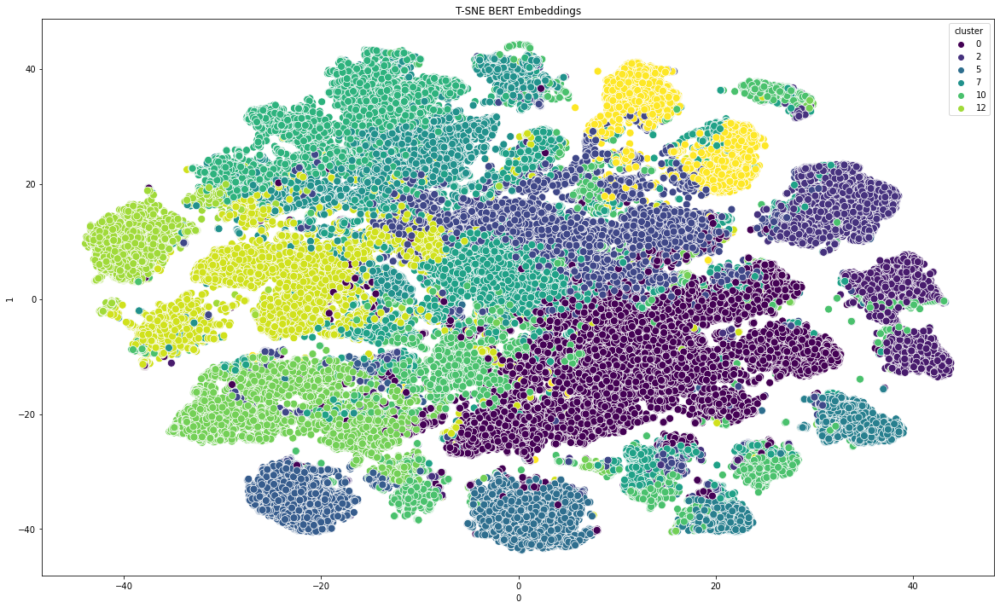

In [49]:
low_embedding_clusters=tsne_visual(embedding_clusters, embeddings_method)

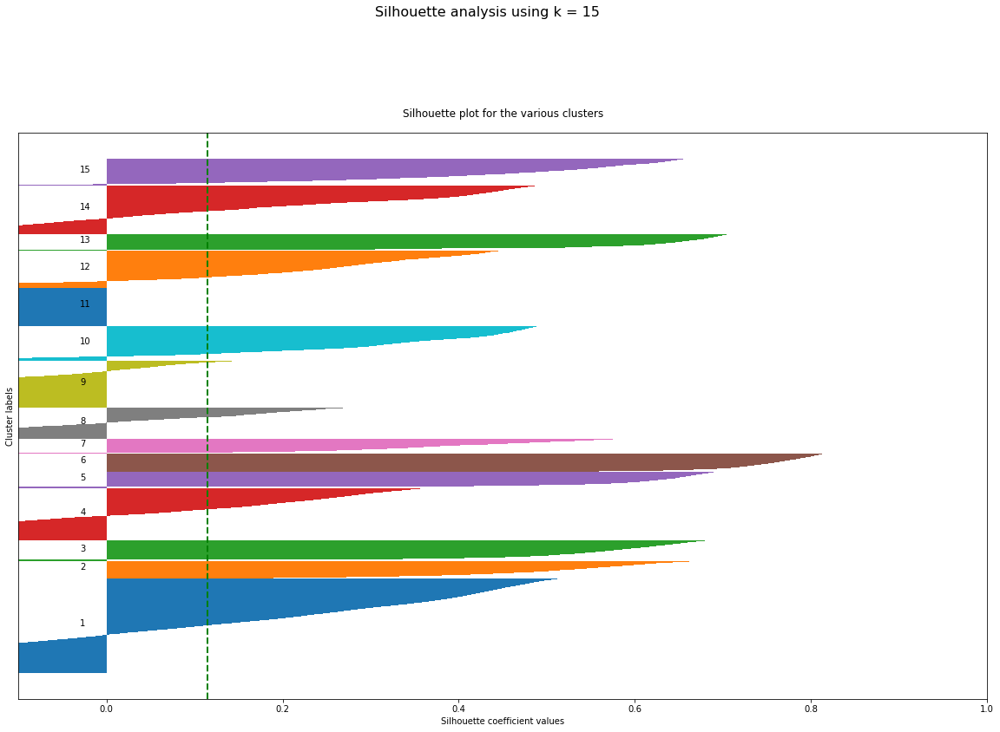

In [50]:
from sklearn.metrics import silhouette_samples, silhouette_score

# Get silhouette samples

plt.figure(figsize=(20,12))

embedding_samples = low_embedding_clusters
labels = embedding_clusters['cluster'].to_numpy()
silhouette_vals = silhouette_samples(embedding_samples, labels)

# Silhouette plot
y_ticks = []
y_lower, y_upper = 0, 0
for i, cluster in enumerate(np.unique(labels)):
    cluster_silhouette_vals = silhouette_vals[labels == cluster]
    cluster_silhouette_vals.sort()
    y_upper += len(cluster_silhouette_vals)
    plt.barh(range(y_lower, y_upper), cluster_silhouette_vals, edgecolor='none', height=1)
    plt.text(-0.03, (y_lower + y_upper) / 2, str(i + 1))
    y_lower += len(cluster_silhouette_vals)


avg_score = np.mean(silhouette_vals)
plt.axvline(avg_score, linestyle='--', linewidth=2, color='green')
plt.yticks([])
plt.xlim([-0.1, 1])
plt.xlabel('Silhouette coefficient values')
plt.ylabel('Cluster labels')
plt.title('Silhouette plot for the various clusters', y=1.02);

plt.suptitle(f'Silhouette analysis using k = {n_clusters}',
             fontsize=16, y=1.05)
plt.show()

## Similar image retrieval based on given image id


Images retrieved using method: embeddings_5
Reference image: 1
Image data: id: 1, coco_id: -1, flickr_id: -1, width: 800, url: https://cs.stanford.edu/people/rak248/VG_100K_2/1.jpg


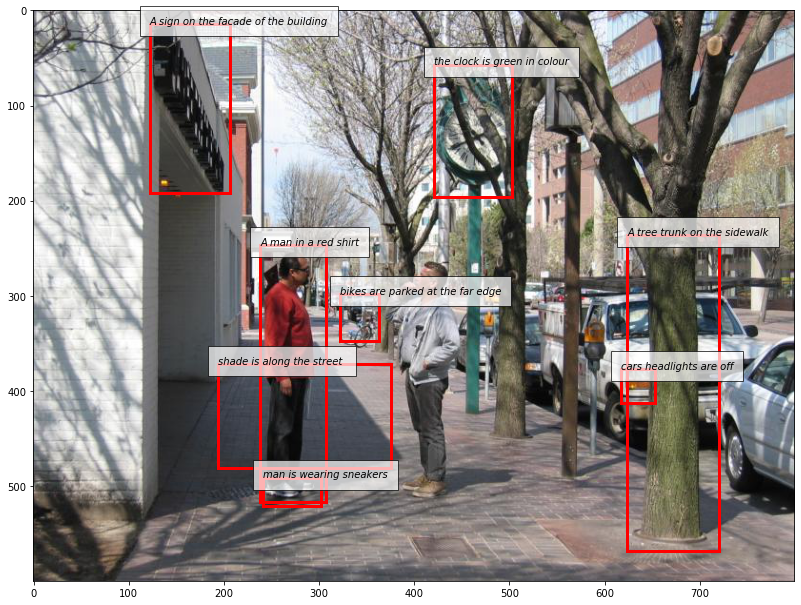

Top 10 most similar images to image 1 in Visual Genome:
Image id: 2410466 Euclidean distance: 5.2513
Image data: id: 2410466, coco_id: 7938, flickr_id: 1327113850, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2410466.jpg


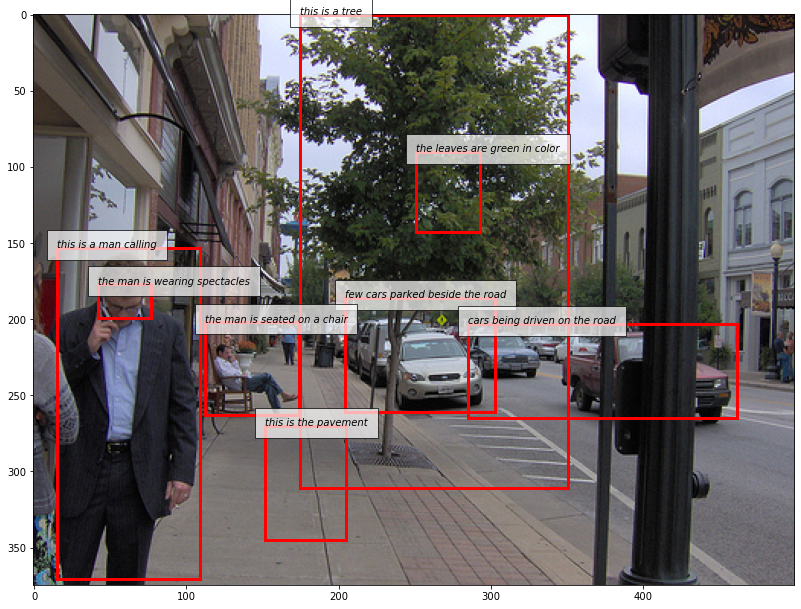

Image id: 2393751 Euclidean distance: 5.2907
Image data: id: 2393751, coco_id: 25069, flickr_id: 2539855183, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2393751.jpg


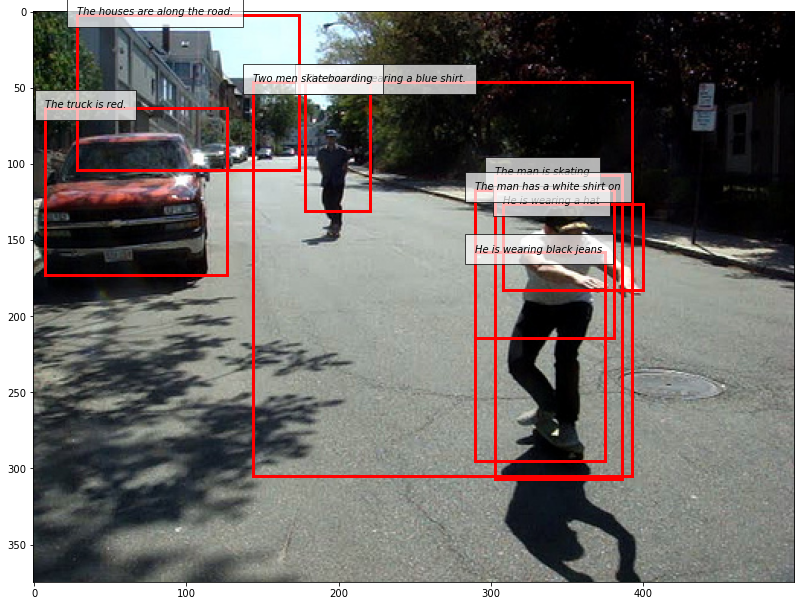

Image id: 2349133 Euclidean distance: 5.3550
Image data: id: 2349133, coco_id: 278656, flickr_id: 664254030, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2349133.jpg


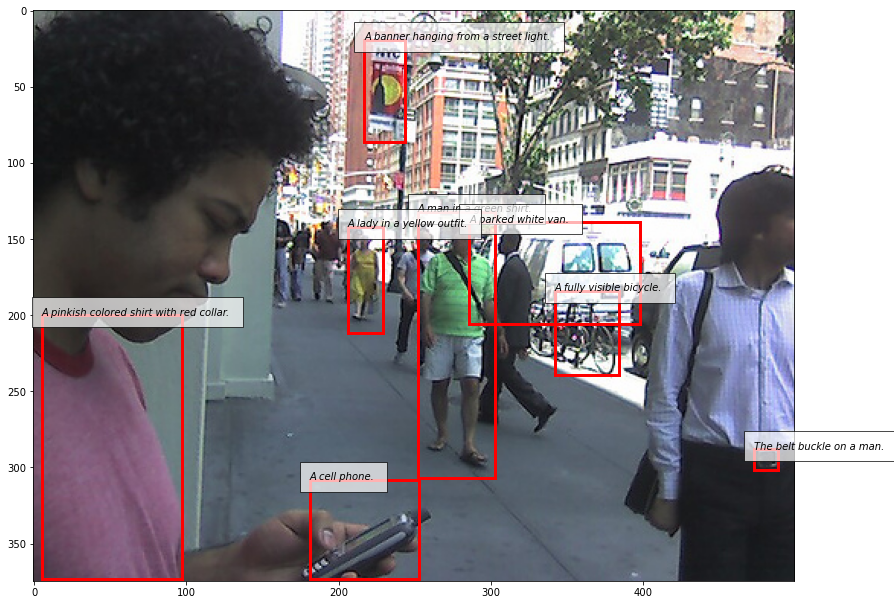

Image id: 2325812 Euclidean distance: 5.4378
Image data: id: 2325812, coco_id: 544893, flickr_id: 8530294114, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2325812.jpg


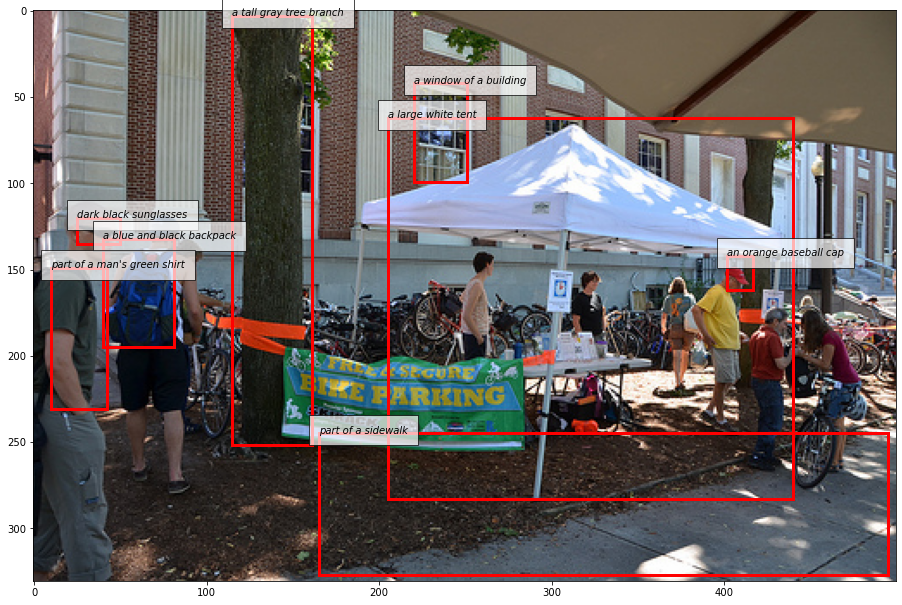

Image id: 2406798 Euclidean distance: 5.4637
Image data: id: 2406798, coco_id: -1, flickr_id: 6296127221, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2406798.jpg


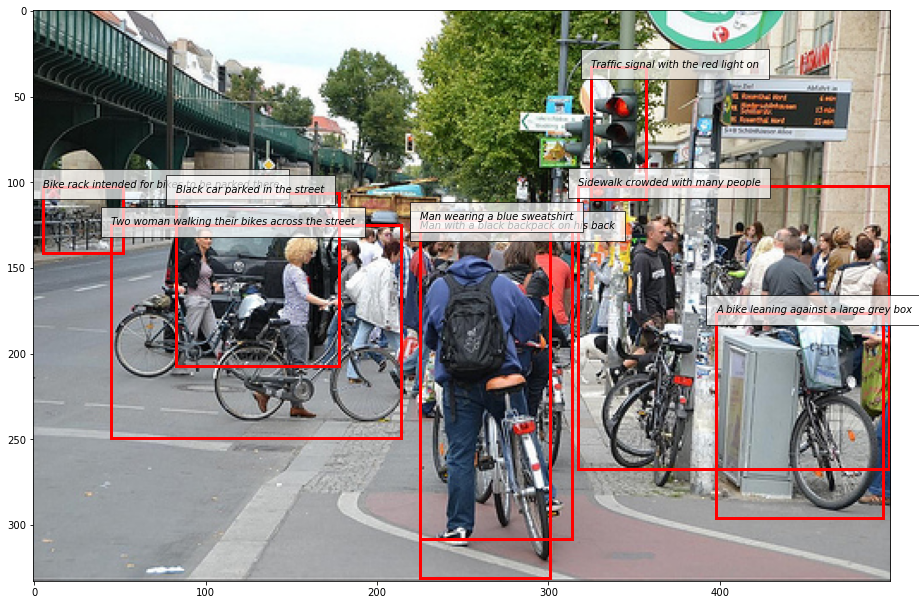

Image id: 2353752 Euclidean distance: 5.4911
Image data: id: 2353752, coco_id: -1, flickr_id: 515548861, width: 375, url: https://cs.stanford.edu/people/rak248/VG_100K/2353752.jpg


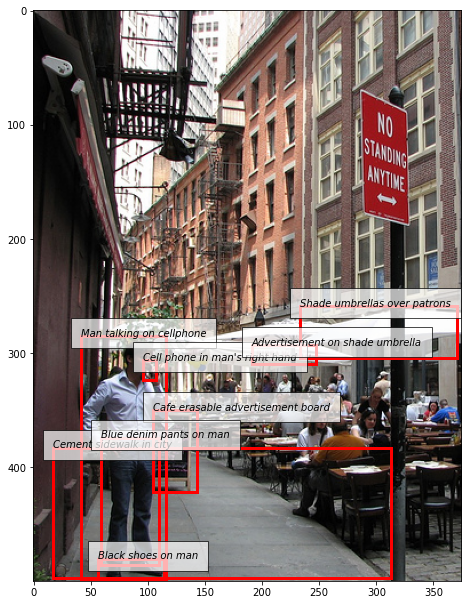

Image id: 2346624 Euclidean distance: 5.5070
Image data: id: 2346624, coco_id: -1, flickr_id: 135227613, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2346624.jpg


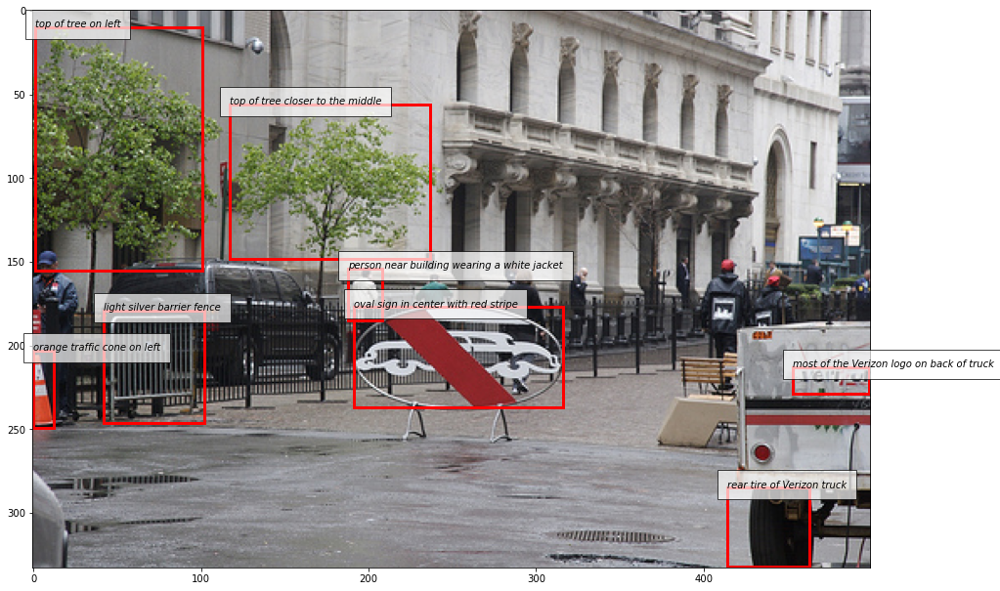

Image id: 2404036 Euclidean distance: 5.5299
Image data: id: 2404036, coco_id: -1, flickr_id: 9430120698, width: 369, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2404036.jpg


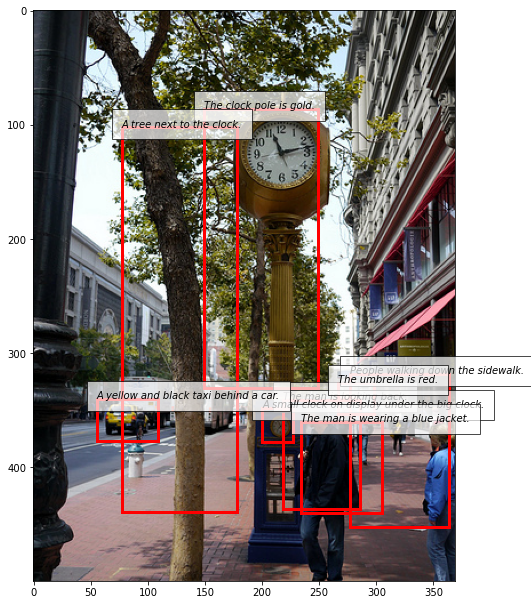

Image id: 4591 Euclidean distance: 5.5374
Image data: id: 4591, coco_id: -1, flickr_id: -1, width: 800, url: https://cs.stanford.edu/people/rak248/VG_100K_2/4591.jpg


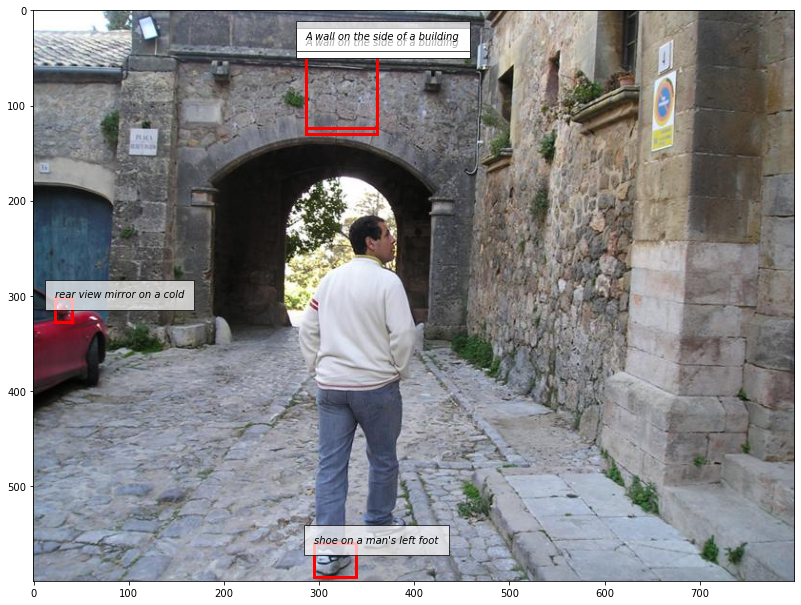

Image id: 2360852 Euclidean distance: 5.5703
Image data: id: 2360852, coco_id: -1, flickr_id: 7153523153, width: 332, url: https://cs.stanford.edu/people/rak248/VG_100K/2360852.jpg


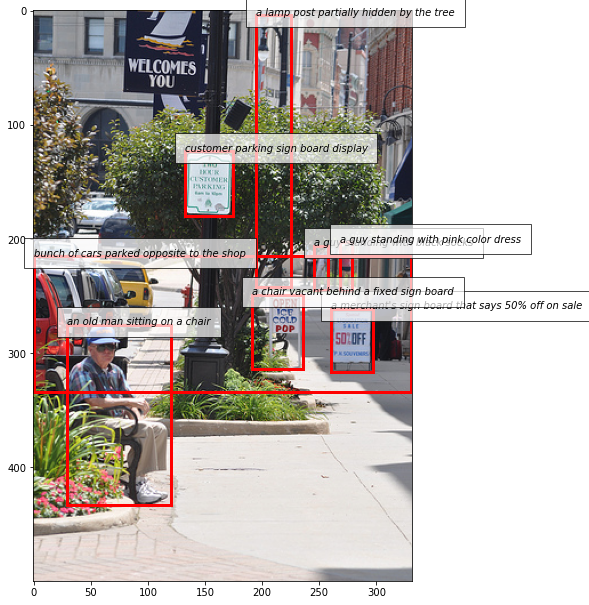

In [57]:
input_id = 1
top_images = retrieve_images(embeddings_method, image_regions, input_id = input_id)

In [37]:
top_images

,image_id,distances
11897,2410466,5.251337
27865,2393751,5.290674
70501,2349133,5.355013
92777,2325812,5.437764
15402,2406798,5.463735
66087,2353752,5.491080
72898,2346624,5.506978
18040,2404036,5.529907
4589,4591,5.537371
59307,2360852,5.570256


## Similar image retrieval based on given user sentence


In [56]:
input_sentence = 'a cat is sleeping on the beach'

In [58]:
input_embedding = get_embeddings(model_5, input_sentence)

Images retrieved using method: embeddings_5
Top 10 most similar images to image -1 in Visual Genome:
Image id: 2331669 Euclidean distance: 16.7695
Image data: id: 2331669, coco_id: 155199, flickr_id: 3491028758, width: 375, url: https://cs.stanford.edu/people/rak248/VG_100K/2331669.jpg


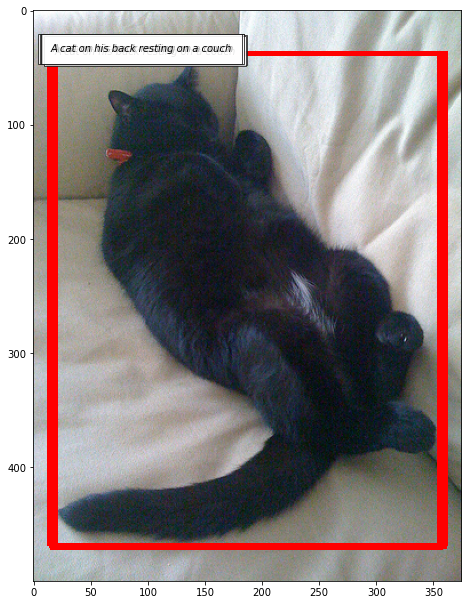

Image id: 2341662 Euclidean distance: 17.3776
Image data: id: 2341662, coco_id: 45208, flickr_id: 2323574426, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2341662.jpg


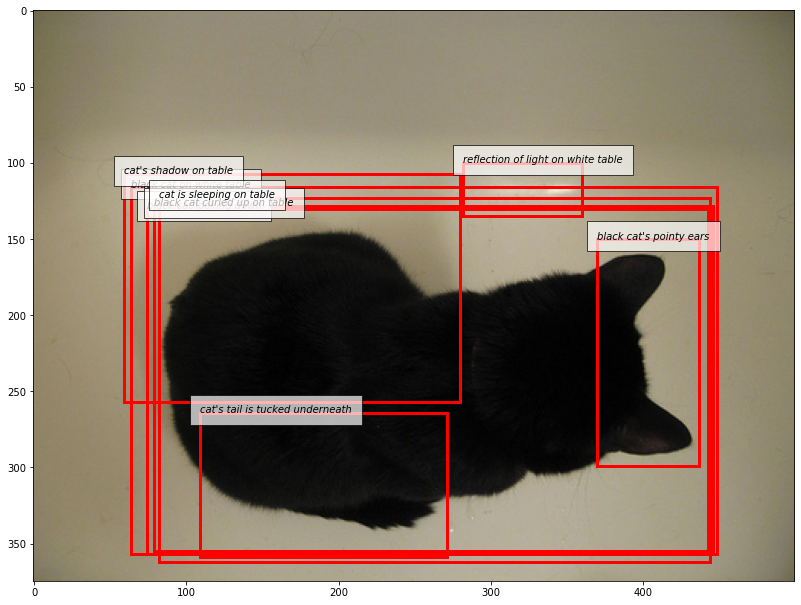

Image id: 2356841 Euclidean distance: 18.0609
Image data: id: 2356841, coco_id: 235842, flickr_id: 2546904630, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2356841.jpg


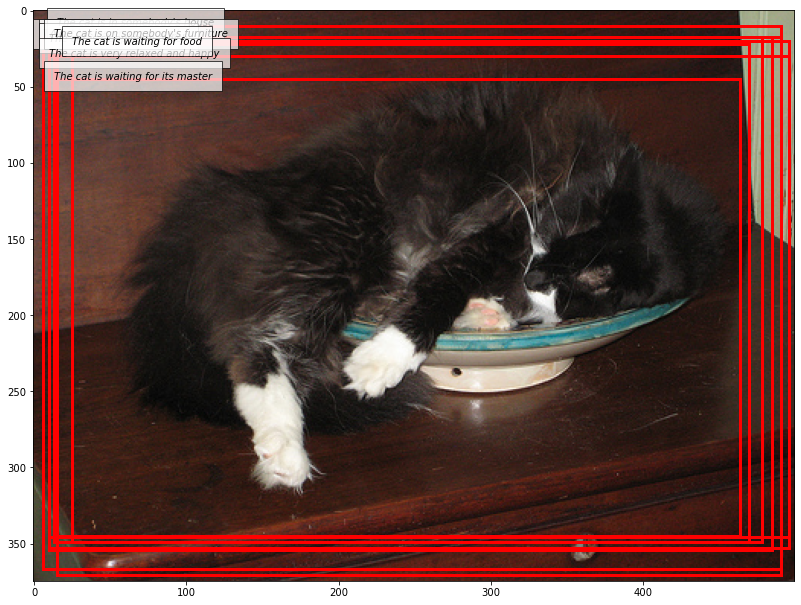

Image id: 2415134 Euclidean distance: 18.4306
Image data: id: 2415134, coco_id: -1, flickr_id: 5399957877, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2415134.jpg


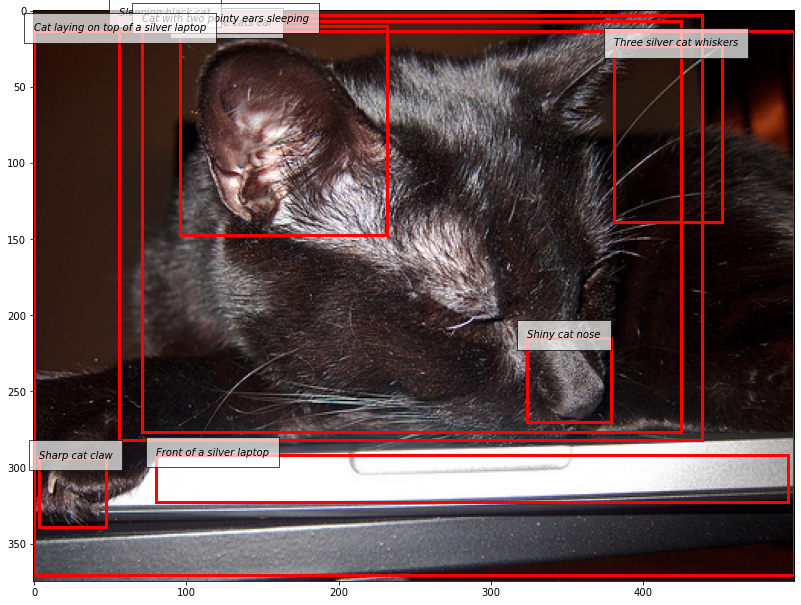

Image id: 2327334 Euclidean distance: 18.4607
Image data: id: 2327334, coco_id: -1, flickr_id: 760075481, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2327334.jpg


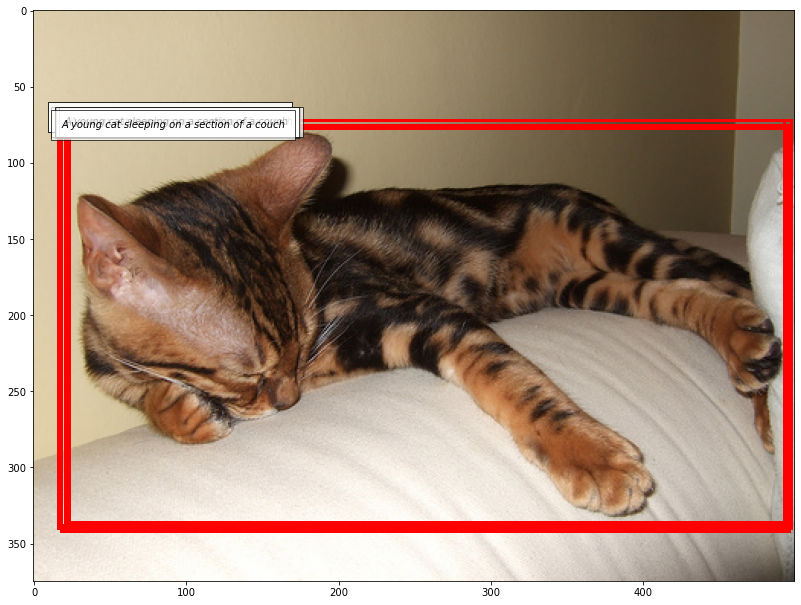

Image id: 2382711 Euclidean distance: 18.7524
Image data: id: 2382711, coco_id: -1, flickr_id: 4383704655, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2382711.jpg


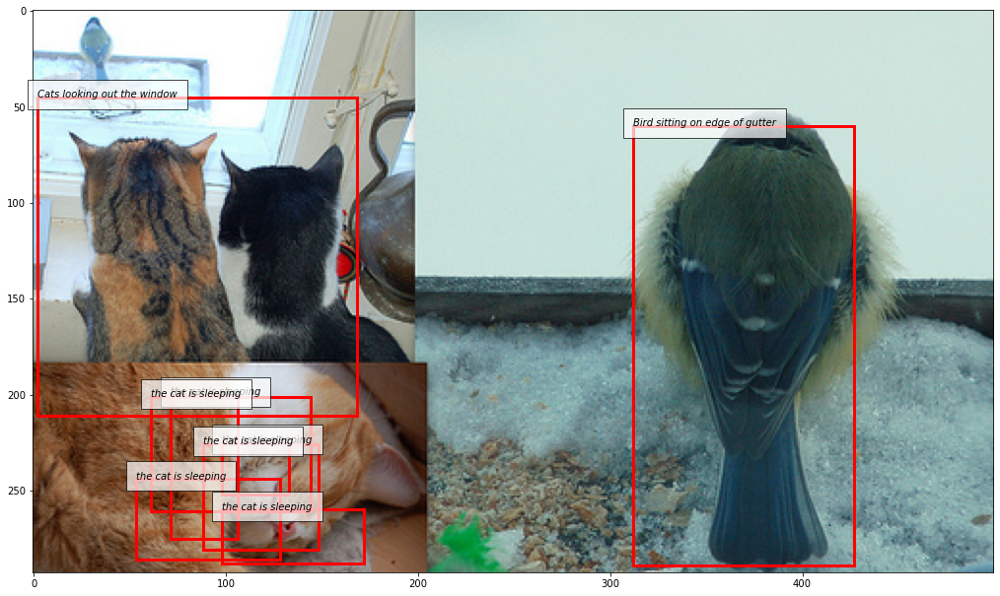

Image id: 2323171 Euclidean distance: 18.7928
Image data: id: 2323171, coco_id: 580427, flickr_id: 2991024301, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2323171.jpg


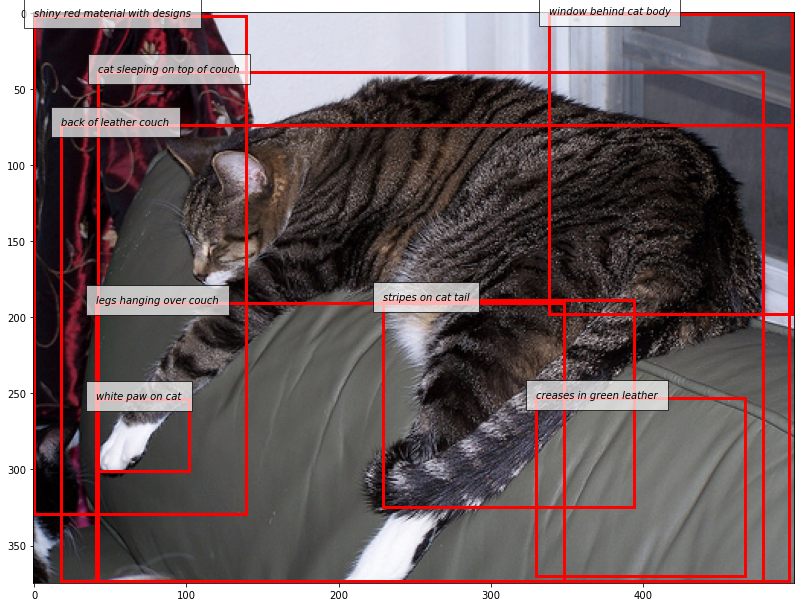

Image id: 2400349 Euclidean distance: 18.8173
Image data: id: 2400349, coco_id: 461775, flickr_id: 534819481, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K_2/2400349.jpg


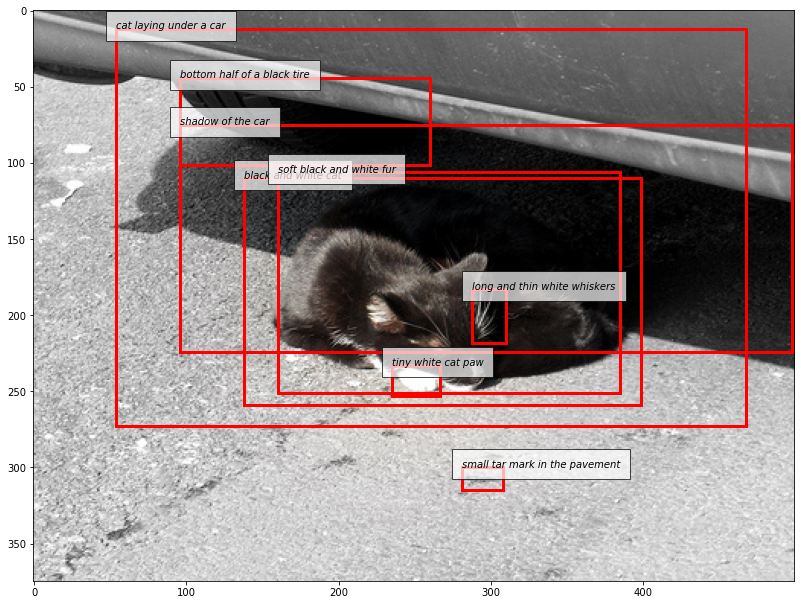

Image id: 2329164 Euclidean distance: 18.9643
Image data: id: 2329164, coco_id: 228882, flickr_id: 3856696841, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2329164.jpg


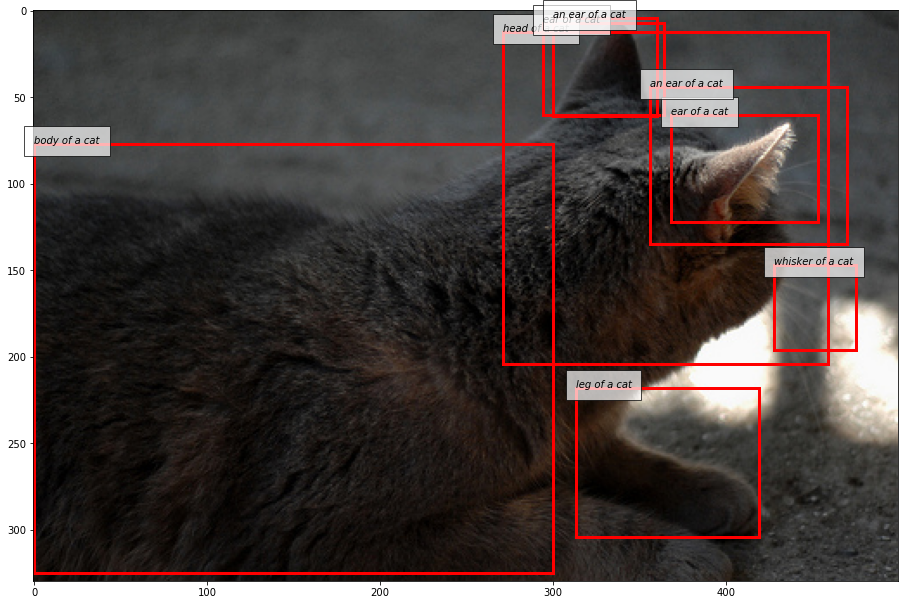

Image id: 2335714 Euclidean distance: 18.9763
Image data: id: 2335714, coco_id: -1, flickr_id: 4217348785, width: 500, url: https://cs.stanford.edu/people/rak248/VG_100K/2335714.jpg


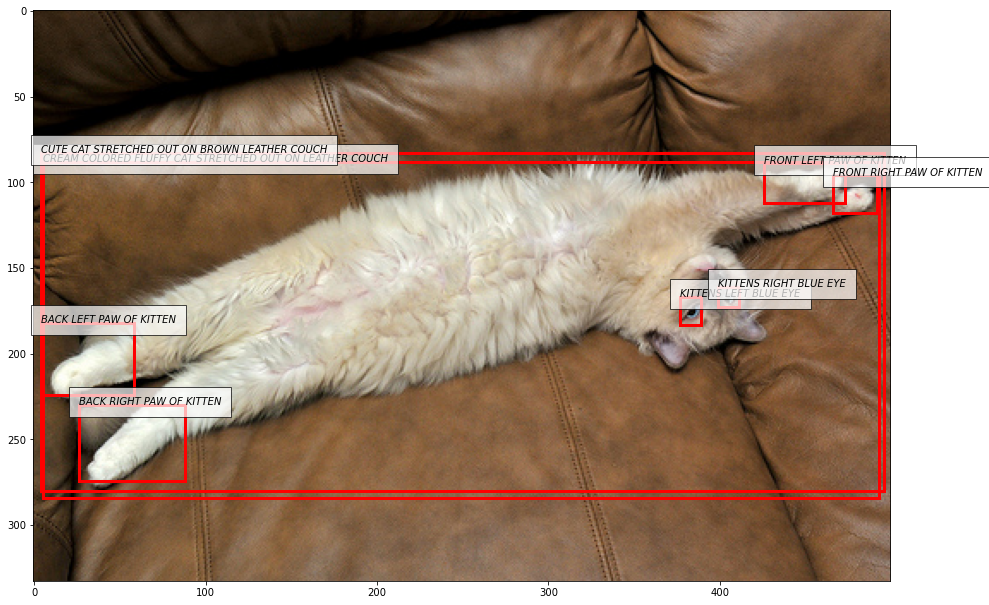

In [59]:
top_images_2 = retrieve_images(embeddings_method, image_regions, input_id = -1, input_embedding=input_embedding)

In [61]:
top_images_2

,image_id,distances
87172,2331669,16.769545
77629,2341662,17.377602
63134,2356841,18.060850
5056,2415134,18.430630
91313,2327334,18.460695
38440,2382711,18.752422
95298,2323171,18.792755
21558,2400349,18.817339
89568,2329164,18.964302
83308,2335714,18.976295
